In [2]:
import numpy as np
from scipy import special
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
import seaborn as sns

import plotly.offline as pyo
import plotly.graph_objects as go
pyo.init_notebook_mode()
from IPython.display import HTML

from tqdm import tqdm

In [3]:
P = np.array([[np.sqrt(3)/2, -1/2], [1/2, np.sqrt(3)/2]])
A = P @ np.diag([1,0.5]) @ np.linalg.inv(P)

def g(xz : np.array) -> np.array: # xz takes 2D array for individual point or 3D array
    return np.tanh(xz @ A.T) / 2

In [4]:
def f(x : np.array, z : np.array) -> np.array:
    return special.expit(-x - 2*z + 0.5)

def f_parallelised(xz : np.array) -> np.array:
    return special.expit(xz @ [[-1],[-2]] + 0.5)

In [5]:
nx, ny = (100, 100)
x_pt = np.linspace(-1, 1, nx)
y_pt = np.linspace(-1, 1, ny)
xx, yy = np.meshgrid(x_pt, y_pt)
xxyy = np.stack([xx,yy],axis=2)
zz = f(xx,yy)
zz2 = f_parallelised(xxyy).reshape(100,100)

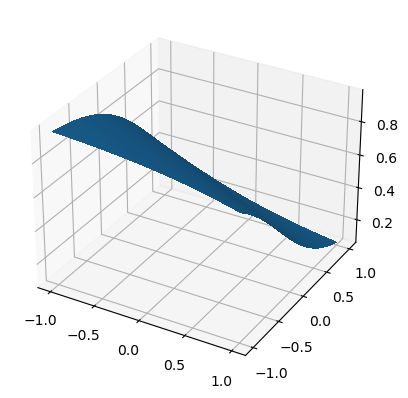

In [41]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
ax.plot_surface(xx, yy, zz, linewidth=0, antialiased=False)

Generating Markov Chain

In [6]:
n_paths = 500
max_n_neurons = 500
T = 30 # timesteps is max_n_neurons * T

In [7]:
# first dimension - steps
# second dimension - paths
# third dimension - index 0 for x, index 1 for z
simulate_xz = np.zeros((max_n_neurons * T, n_paths, 2))

In [8]:
np.random.seed(1234)
simulate_xz[0] = np.random.uniform(-1,1,size=(n_paths,2))

In [9]:
for k in tqdm(range(max_n_neurons * T - 1)):
    simulate_xz[k+1] = g(simulate_xz[k]) + 0.5 * np.random.uniform(-1,1,size=(n_paths,2))

100%|██████████| 14999/14999 [00:00<00:00, 66750.31it/s]


Code for generating a single histogram

In [11]:
HIST_BINS = np.linspace(-2, 2, 100)

def prepare_animation(bar_container):

    def animate(frame_number):
        # simulate new data coming in
        data = simulate_xz[frame_number][:,0]
        n, _ = np.histogram(data, HIST_BINS)
        for count, rect in zip(n, bar_container.patches):
            rect.set_height(count)
        return bar_container.patches
    return animate

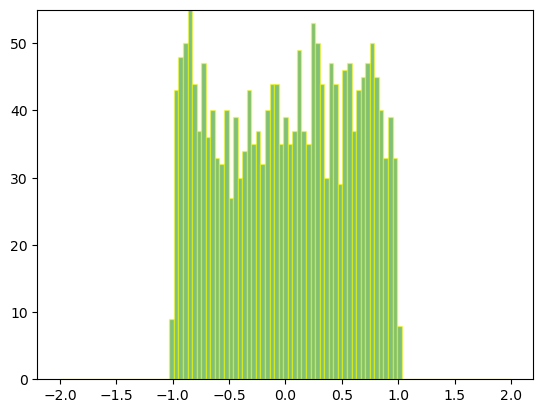

In [12]:
fig, ax = plt.subplots()
_, _, bar_container = ax.hist(simulate_xz[0][:,0], HIST_BINS, lw=1, ec="yellow", fc="green", alpha=0.5)
ax.set_ylim(top=55)  # set safe limit to ensure that all data is visible.

ani = FuncAnimation(fig, prepare_animation(bar_container), 4000, repeat=False, blit=True)

Code for plotting two empirical distribution (KDE)

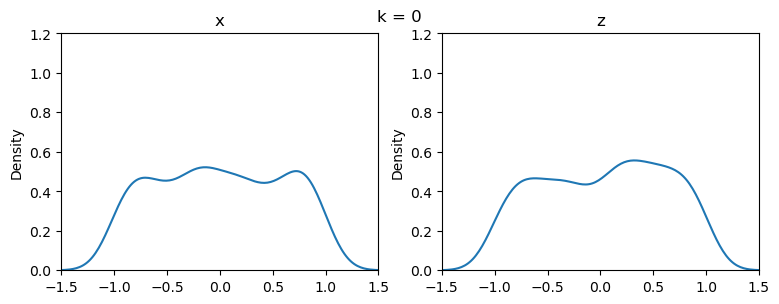

In [52]:
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(9,3))
fig.subplots_adjust(top=0.9)

def animate(i, ax0, ax1):
    ax0.cla()
    ax1.cla()
    sns.kdeplot(x=simulate_xz[2*i][:,0], ax=ax0)
    sns.kdeplot(x=simulate_xz[2*i][:,1], ax=ax1)
    ax0.set_title("x")
    ax0.set_xlim([-1.5,1.5])
    ax0.set_ylim([0,1.2])
    ax1.set_title("z")
    ax1.set_xlim([-1.5,1.5])
    ax1.set_ylim([0,1.2])
    fig.suptitle(f"k = {i}")

ani = FuncAnimation(fig, animate, 200, interval=100, repeat=True, fargs=(ax0, ax1))

In [53]:
HTML(ani.to_html5_video())

Code for plotting joint distribution

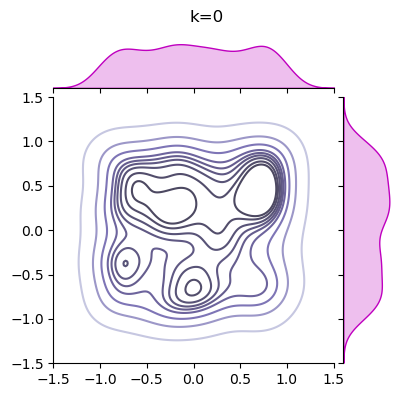

In [15]:
def get_data(i=0):
    x = simulate_xz[10*i][:,0]
    y = simulate_xz[10*i][:,1]
    return x,y

x,y = get_data()
gr = sns.JointGrid(x=x, y=y, height=4)
gr.fig.subplots_adjust(top=0.9)
lim = (-1.5,1.5)

def prep_axes(g, xlim, ylim, i=0):
    gr.ax_joint.clear()
    gr.ax_joint.set_xlim(xlim)
    gr.ax_joint.set_ylim(ylim)
    gr.fig.suptitle(f"k={10*i}")
    gr.ax_marg_x.clear()
    gr.ax_marg_x.set_xlim(xlim)
    gr.ax_marg_y.clear()
    gr.ax_marg_y.set_ylim(ylim)
    plt.setp(gr.ax_marg_x.get_xticklabels(), visible=False)
    plt.setp(gr.ax_marg_y.get_yticklabels(), visible=False)
    plt.setp(gr.ax_marg_x.yaxis.get_majorticklines(), visible=False)
    plt.setp(gr.ax_marg_x.yaxis.get_minorticklines(), visible=False)
    plt.setp(gr.ax_marg_y.xaxis.get_majorticklines(), visible=False)
    plt.setp(gr.ax_marg_y.xaxis.get_minorticklines(), visible=False)
    plt.setp(gr.ax_marg_x.get_yticklabels(), visible=False)
    plt.setp(gr.ax_marg_y.get_xticklabels(), visible=False)

def animate(i):
    gr.x, gr.y = get_data(i)
    prep_axes(gr, lim, lim, i)
    gr.plot_joint(sns.kdeplot, cmap="Purples_d")
    gr.plot_marginals(sns.kdeplot, color="m", fill=True)

ani = FuncAnimation(gr.fig, animate, 50, interval=100, repeat=True)

In [29]:
HTML(ani.to_html5_video())

We have now set up the codes for graphs, we can now study the convergence of the untrained memories as well!

In [36]:
n_neurons = 500

: 

Let us initialise the weights and the biases.

In [23]:
# B0 = np.random.uniform(0,1,size = (n_neurons, n_paths))
B0 = np.zeros((n_neurons, n_paths))
W0 = np.random.normal(0,1,size = (n_neurons, n_paths))

In [24]:
simulate_h = np.zeros((n_neurons * T, n_neurons, n_paths))
simulate_h[1] = special.expit(W0 * simulate_xz[0,:,0])

In [25]:
for k in tqdm(range(1,n_neurons * T - 1)):
    simulate_h[k+1] = special.expit(W0 * simulate_xz[k,:,0] + np.sum(B0 * simulate_h[k], axis=0) / n_neurons)


100%|██████████| 14998/14998 [00:49<00:00, 300.73it/s]


Now study the histogram of the simulated neurons

In [26]:
def get_data(i=1, path=0):
    x = simulate_h[i,:,path]
    return x

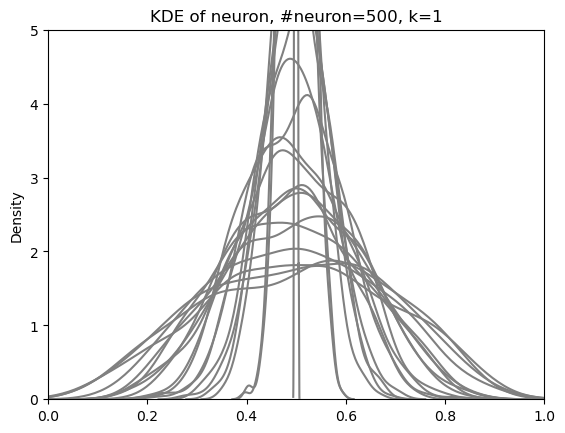

In [33]:
fig, ax = plt.subplots()

def animate(i, ax):
    ax.cla()
    for path in range(20):
        sns.kdeplot(x=get_data(i = 10*i+1, path = path), ax=ax, color="gray")
    
    ax.set_title(f"KDE of neuron, #neuron={n_neurons}, k={10*i+1}")
    ax.set_xlim([0,1])
    ax.set_ylim([0,5])

ani = FuncAnimation(fig, animate, 200, interval=100, repeat=True, fargs=(ax,))

In [34]:
HTML(ani.to_html5_video())